In [10]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
def map_of_clusters(adata,key='leiden',clusters='all',size=8,background='white',figuresize=(10,7),save=None,format='pdf'):
    
    #PARAMETERS TO MODIFY:
    #-key: the terms in adata.obs that you want to plot
    #-clusters:'all' for plotting all clusters in a single plot, 'individual': for plots of individual genes, or ['3','5'] (your groups
    #          between square brackets to plot only some clusters
    #-size: to change the size of your spots
    #-background: to change the color of the background
    #-figuresize: to specify the size of your figure
    #-save: if you want to save your figure, give the PATH of the folder where you want to save it
    #-format: specify the format in which you want to save your figure
    
    try:
        adata.obs[key]=adata.obs[key].astype(int)
        colors=dict(zip(np.unique(adata.obs[key]),adata.uns[key+'_colors']))
    except:
        colors=dict(zip(np.unique(adata.obs[key]),adata.uns[key+'_colors']))
    #cl.apply(lambda x: colors[x])
    plt.rcParams['figure.facecolor'] = background
    if clusters=='all':
        cl=adata.obs[key]
        plt.figure(figsize=figuresize)
        figa=plt.scatter(x=adata.obs.X,y=adata.obs.Y,c=cl.apply(lambda x: colors[x]),s=size,linewidths=0, edgecolors=None)
        plt.axis('off')
        if not save==None:
            plt.savefig(save +'/map_all_clusters_'+str(size)+'_'+background+'_'+key+'.'+format)
    elif clusters=='individual':
        cl=adata.obs[key]
        for each in adata.obs[key].unique():
            adatasub=adata[adata.obs[key]==each]
            plt.figure(figsize=figuresize)
            plt.scatter(x=adata.obs.X,y=adata.obs.Y,c='grey',s=size/5,linewidths=0, edgecolors=None)
            cl=adatasub.obs[key]
            plt.scatter(x=adatasub.obs.X,y=adatasub.obs.Y,c=cl.apply(lambda x: colors[x]),s=size,linewidths=0, edgecolors=None)
            plt.axis('off')
            plt.title('Group: '+ str(each))
            if not save==None:
                plt.savefig(save +'/map_inidivdual_cluster_'+str(each)+'_'+str(size)+background+'_'+key+'.'+format)
    else:
        adatasub=adata[adata.obs[key].isin(clusters)]
        plt.figure(figsize=figuresize)
        plt.scatter(x=adata.obs.X,y=adata.obs.Y,c='grey',s=size/5,linewidths=0, edgecolors=None)
        cl=adatasub.obs[key]
        plt.scatter(x=adatasub.obs.X,y=adatasub.obs.Y,c=cl.apply(lambda x: colors[x]),s=size,linewidths=0, edgecolors=None)
        plt.axis('off')
        plt.legend()
        if not save==None:
                s=''
                for element in clusters:
                    s=s+str(element)
                print(s)
                plt.savefig(save +'/map_group_of_clusters_'+str(s)+'_'+str(size)+background+'_'+key+'.'+format)
#        plt.title('Group: '+ paste(clusters))

In [11]:
meta=pd.read_excel("/mnt/f/COPD/COPD-clusters-final-upd.xlsx")
expr=pd.read_excel("/mnt/f/COPD/COPD-Healthy-genes1-49norare.xlsx")

In [12]:
adata=sc.AnnData(expr.iloc[:,10:],obs=expr.iloc[:,0:10])

/home/sergioms/.local/lib/python3.8/site-packages/anndata/utils.py:143: UserWarning: X converted to numpy array with dtype float64
  warnings.warn(f"{name} converted to numpy array with dtype {arr.dtype}")
/tmp/ipykernel_457/2919292474.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata=sc.AnnData(expr.iloc[:,10:],obs=expr.iloc[:,0:10])
/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [15]:
expr.columns

Index(['Number', 'Donor', 'Sample', 'Disease', 'Smoking', 'Gender', 'roi',
       'Area', 'X', 'Y', 'SCGB3A2', 'MUC5B', 'GHRL', 'CPA3', 'CCL5', 'CYB5A',
       'KRT15', 'SPARCL1', 'CLDN5', 'IL7R', 'CD52', 'SFTPC', 'SAA1', 'HLA-DRA',
       'COL1A2', 'LTF', 'ETV5', 'TAGLN', 'S100A2', 'AGER', 'NAPSA', 'S100A9',
       'TIMP1', 'KRT5', 'SERPINB3', 'KRT13', 'FBLN1', 'FABP4', 'CAPS',
       'SCGB3A1', 'KRT6A', 'MSMB', 'MSLN', 'MGP', 'RNASE1', 'APOE', 'CD69',
       'IL13', 'TFF3', 'S100A4', 'SCGB1A1', 'ASCL3', 'MUC5AC', 'CDC20B',
       'LCN2'],
      dtype='object')

In [14]:
adata

AnnData object with n_obs × n_vars = 163286 × 45
    obs: 'Number', 'Donor', 'Sample', 'Disease', 'Smoking', 'Gender', 'roi', 'Area', 'X', 'Y'

In [16]:
sc.pp.filter_cells(adata,min_genes=3)
sc.pp.filter_cells(adata,min_counts=5)

In [6]:
adata.raw=adata
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [6]:
sc.pp.neighbors(adata,n_neighbors=10,n_pcs=0)#,use_rep='X')
#sc.tl.umap(adata2,min_dist=0.001)#0.001)
sc.tl.umap(adata,min_dist=0.01)#0.001)

/home/sergioms/.local/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/sergioms/.local/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/sergioms/.local/lib/python3.8/site-packages/umap/distances.py:1086: NumbaDeprecationWarning:

In [17]:
meta['ID']=meta['Sample']+'_'+meta['X'].astype(str)+'_'+meta['Y'].astype(str)
adata.obs['ID']=adata.obs['Sample'].astype(str)+'_'+adata.obs['X'].astype(str)+'_'+adata.obs['Y'].astype(str)

In [18]:
id2ct=dict(zip(meta['ID'],meta['Cell type']))
adata.obs['celltype']=adata.obs['ID'].map(id2ct)

In [19]:
sc.set_figure_params(scanpy=True, dpi=150, dpi_save=150, frameon=True, vector_friendly=True, fontsize=14, figsize=(10,10), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
sc.pl.umap(adata,color=['celltype'],vmax='p99.5',s=20)

KeyError: "Could not find 'umap' or 'X_umap' in .obsm"

In [10]:
sc.tl.leiden(adata,key_added='leiden',resolution=2.0)

In [ ]:
sc.set_figure_params(scanpy=True, dpi=150, dpi_save=150, frameon=True, vector_friendly=True, fontsize=14, figsize=(10,10), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
sc.pl.umap(adata,color='leiden',s=10)#,legend_loc='on data',legend_fontsize=7)

In [12]:
disease_dict=dict(zip(adata.obs['Sample'],adata.obs['Disease']))
adata.obs['Disease']=adata.obs['Sample'].map(disease_dict)

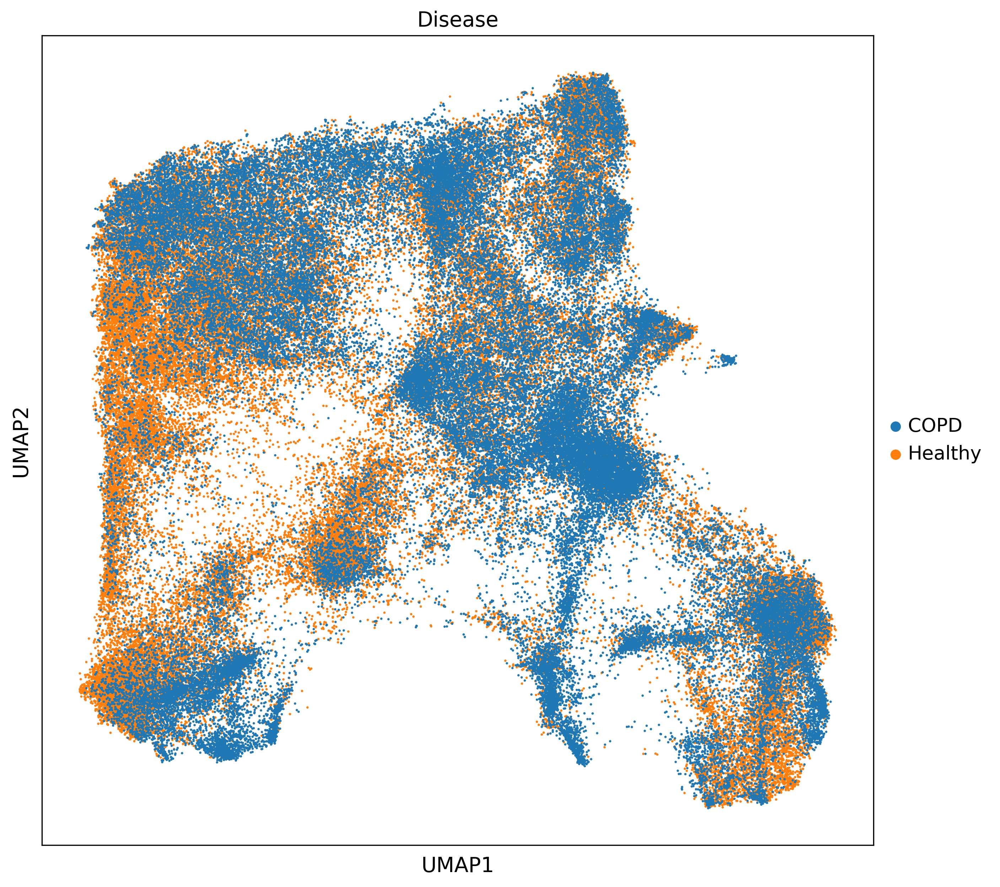

In [13]:
sc.set_figure_params(scanpy=True, dpi=150, dpi_save=150, frameon=True, vector_friendly=True, fontsize=14, figsize=(10,10), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
sc.pl.umap(adata,color='Disease',s=10)#,legend_loc='on data',legend_fontsize=7)

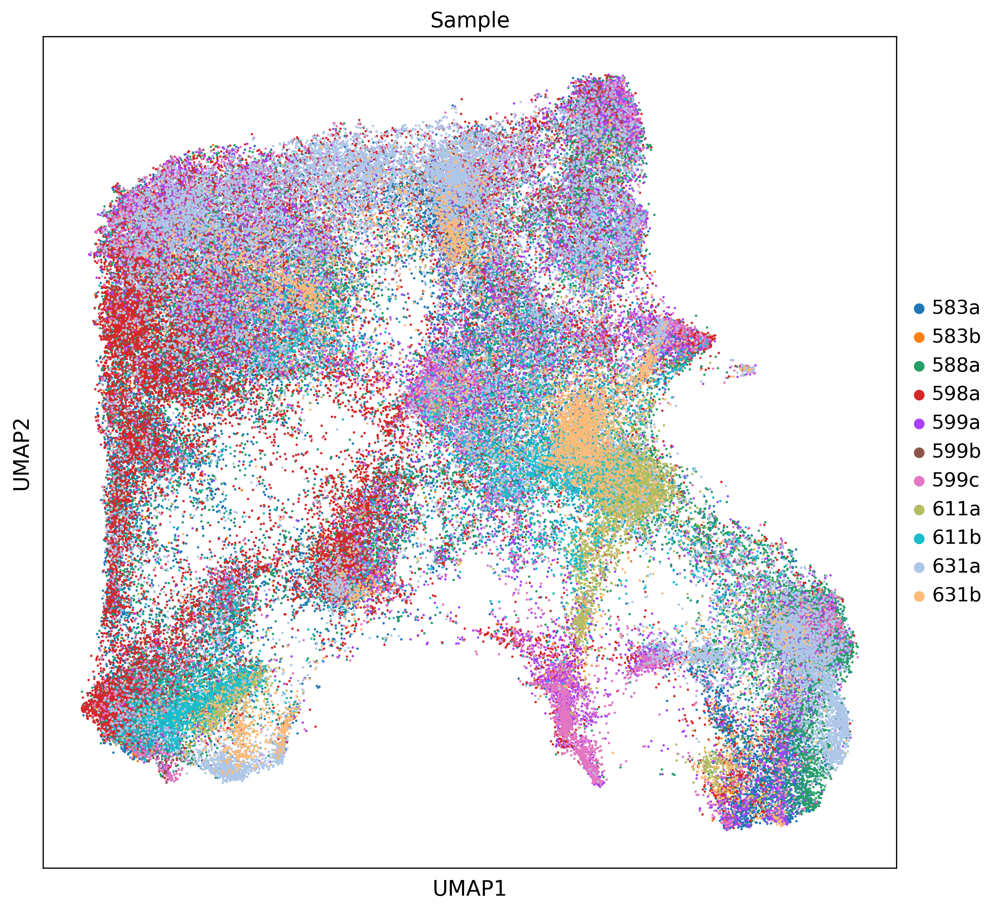

In [14]:
sc.set_figure_params(scanpy=True, dpi=150, dpi_save=150, frameon=True, vector_friendly=True, fontsize=14, figsize=(10,10), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
sc.pl.umap(adata,color='Sample',s=10)#,legend_loc='on data',legend_fontsize=7)

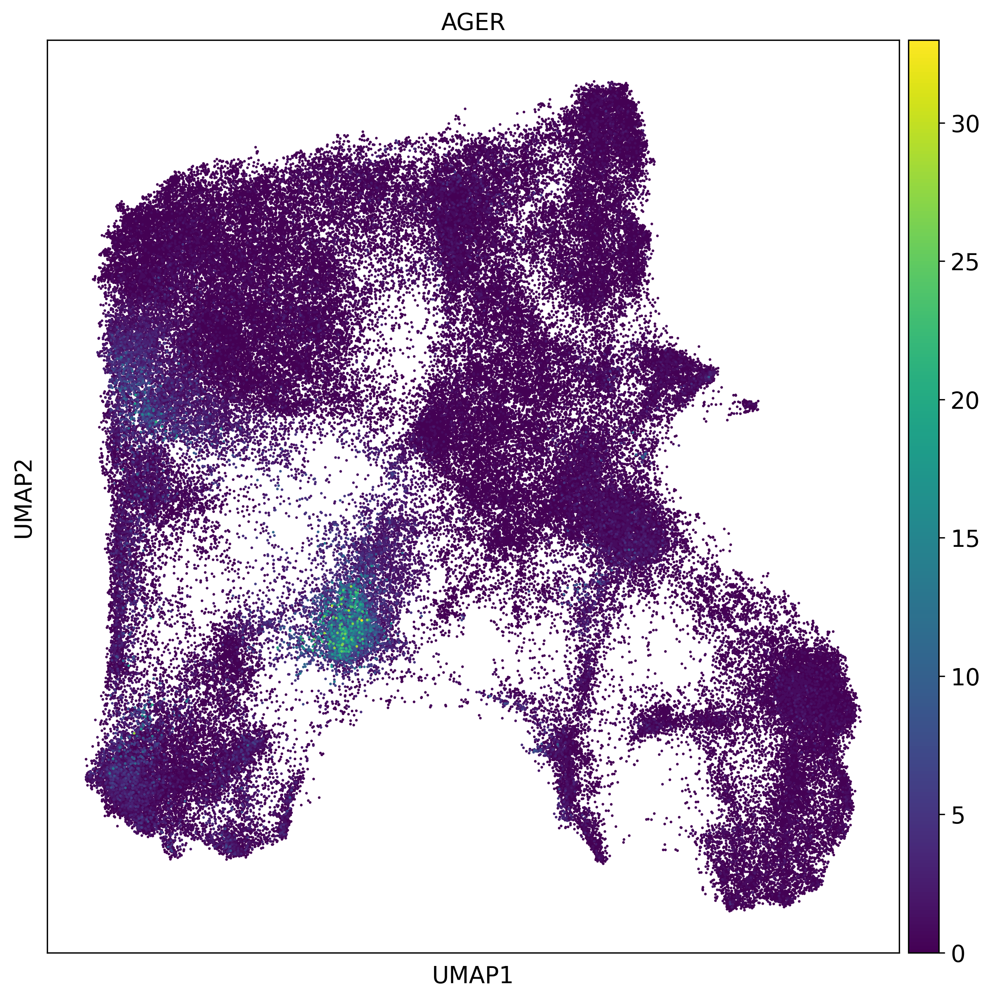

In [15]:
sc.set_figure_params(scanpy=True, dpi=150, dpi_save=150, frameon=True, vector_friendly=True, fontsize=14, figsize=(10,10), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
sc.pl.umap(adata,color='AGER',s=10)#,legend_loc='on data',legend_fontsize=7)

In [ ]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='wilcoxon')
sc.pl.rank_genes_groups_dotplot(adata, n_genes=4, swap_axes=True)

In [ ]:
sc.set_figure_params(scanpy=True, dpi=150, dpi_save=150, frameon=True, vector_friendly=True, fontsize=14, figsize=(10,10), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
sc.pl.umap(adata,color=['CLDN5','SFTPC','COL1A2','LTF'],s=10,vmax='p99',ncols=2)#,legend_loc='on data',legend_fontsize=7)

In [21]:
keya='celltype' #celltype
clust=pd.crosstab(adata.obs['Sample'],adata.obs[keya])
clust=clust.div(clust.sum(axis=1),axis=0)

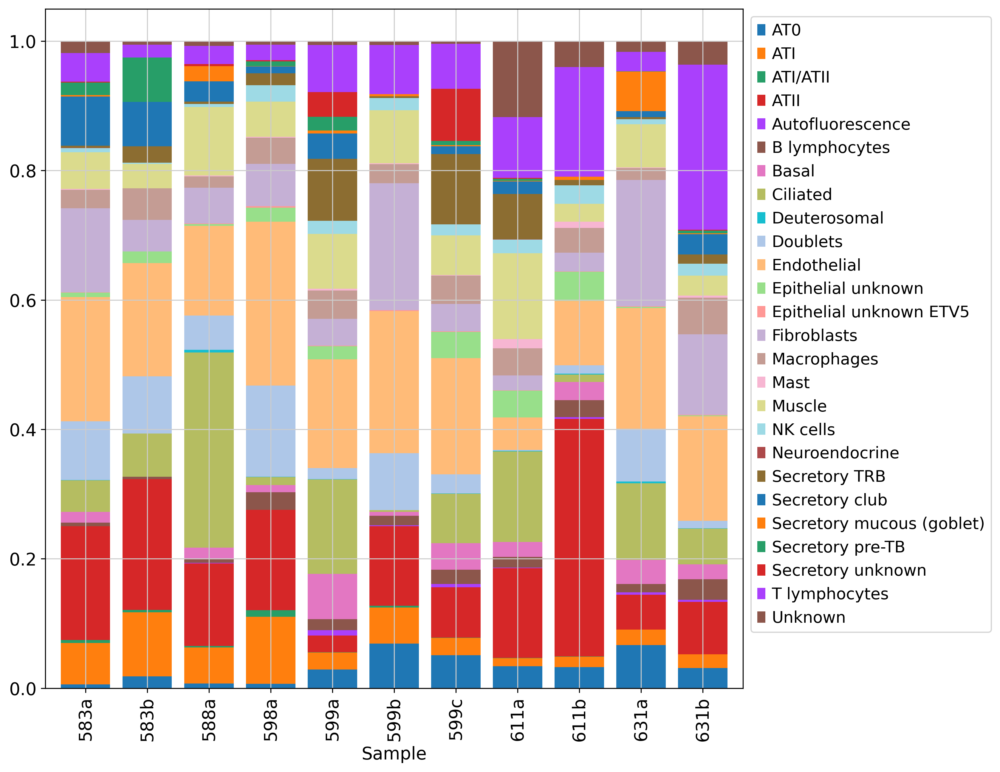

In [22]:
clust.plot(kind='bar',stacked=True,width=0.8)
plt.legend(bbox_to_anchor=[1, 1])
plt.savefig('/mnt/f/ISS/plots_for_publication/SCRINSHOT_COPD/freqs_celltype_sample_barplot.pdf',bbox_inches="tight")

In [23]:
keya='celltype' #celltype
clust=pd.crosstab(adata.obs['Donor'],adata.obs[keya])
clust=clust.div(clust.sum(axis=1),axis=0)

In [ ]:
clust.plot(kind='bar',stacked=True,width=0.8)
plt.legend(bbox_to_anchor=[1, 1])
plt.savefig('/mnt/f/ISS/plots_for_publication/SCRINSHOT_COPD/freqs_celltype_donor_barplot.pdf',bbox_inches="tight")

In [46]:
keya='celltype' #celltype
clust=pd.crosstab(adata.obs['Donor'],adata.obs[keya])
clust=clust.div(clust.sum(axis=1),axis=0)

In [47]:
clust=clust.loc[:,~clust.columns.isin(['Unknown','Autofluorescence','Doublets'])]
clust.columns=clust.columns.astype(str).astype('category')

In [48]:
## we exclude two samples due to their airway comp
disease_dict=dict(zip(adata.obs['Donor'],adata.obs['Disease']))
smp=clust.stack().reset_index()
#smp=smp[~smp['Sample'].isin(['588a','631a'])]
smp['Disease']=smp['Donor'].map(disease_dict)

In [ ]:
import seaborn as sns
plt.figure(figsize=(6,16))
sns.boxplot(data=smp,y=keya,x=0,hue='Disease',palette=['orange','#0D72B0'])
sns.stripplot(data=smp,y=keya,x=0,hue='Disease',dodge=True,palette=['orange','#075D92'])
plt.savefig('/mnt/f/ISS/plots_for_publication/SCRINSHOT_COPD/freqs_celltype_COPD_disease_boxplot_donor.pdf',bbox_inches="tight")

In [32]:
## we exclude two samples due to their airway comp
disease_dict=dict(zip(adata.obs['Sample'],adata.obs['Disease']))
smp=clust.stack().reset_index()
smp=smp[~smp['Sample'].isin(['588a','631a'])]
smp['Disease']=smp['Sample'].map(disease_dict)

In [33]:
import seaborn as sns
plt.figure(figsize=(6,16))
sns.boxplot(data=smp,y=keya,x=0,hue='Disease')
sns.stripplot(data=smp,y=keya,x=0,hue='Disease',dodge=True)
plt.savefig('/mnt/f/ISS/plots_for_publication/SCRINSHOT_COPD/freqs_celltype_COPD_disease_boxplot.pdf',bbox_inches="tight")

,Donor,celltype,0
0,Donor 583,AT0,0.006292
1,Donor 583,ATI,0.065141
2,Donor 583,ATI/ATII,0.004703
3,Donor 583,ATII,0.176549
4,Donor 583,Autofluorescence,0.000127
...,...,...,...
151,Donor 631,Secretory mucous (goblet),0.045481
152,Donor 631,Secretory pre-TB,0.001226
153,Donor 631,Secretory unknown,0.000320
154,Donor 631,T lymphocytes,0.090749


In [ ]:
import seaborn as sns
plt.figure(figsize=(6,16))
sns.boxplot(data=smp,y=keya,x=0,hue='Donor')
sns.stripplot(data=smp,y=keya,x=0,hue='Donor',dodge=True)
plt.savefig('/mnt/f/ISS/plots_for_publication/SCRINSHOT_COPD/freqs_celltype_COPD_donor_boxplot.pdf',bbox_inches="tight")

In [ ]:
import seaborn as sns
plt.figure(figsize=(6,16))
sns.boxplot(data=smp,y='celltype',x=0,hue='Disease')

In [12]:
adata.obs['SD']=adata.obs['Donor'].astype(str)+'_'+adata.obs['Disease'].astype(str)

In [ ]:
for cti in adata.obs['celltype'].unique():
    asub=adata[adata.obs['celltype']==cti].copy()
    print(cti)
    try:
        sc.tl.rank_genes_groups(asub,groupby='Disease')
        #sc.pl.rank_genes_groups_dotplot(asub,n_genes=2)
        cop = sc.get.rank_genes_groups_df(asub, group="COPD")
        hel = sc.get.rank_genes_groups_df(asub, group="Healthy")
        gentp=list(hel[hel['pvals']<0.001]['names'])+list(cop[cop['pvals']<0.001]['names'])
        sc.pl.dotplot(asub,gentp,groupby='SD',show=False)
        plt.savefig('/mnt/f/ISS/plots_for_publication/SCRINSHOT_COPD/DEG_ct_by_condition/'+str(cti)+'.pdf',bbox_inches="tight")
    except:
        print('notposs')

In [167]:
adata.obs['celltype']=adata.obs['celltype'].astype(str).fillna('nan')

In [ ]:
sc.pl.umap(adata,color='celltype')

In [ ]:
for a in adata.obs['Sample'].unique():
    ads=adata[adata.obs['Sample']==a]
#    sc.pl.umap(ads,color=['annotation_2'],cmap='hsv',s=30)#,'total_counts'])#,save='chickbrain_UMAP_bins.pdf')
    map_of_clusters(ads,key=keya,figuresize=(8,8),size=5,clusters='all')

In [ ]:
sc.pl.rank_genes_groups(adata, n_genes=5, swap_axes=True,fontsize=35)

In [32]:
adata

AnnData object with n_obs × n_vars = 130891 × 45
    obs: 'Number', 'Donor', 'Sample', 'Disease', 'Smoking', 'Gender', 'roi', 'Area', 'X', 'Y', 'n_genes', 'n_counts', 'ID', 'celltype', 'SD'
    uns: 'log1p', 'neighbors', 'umap', 'celltype_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [44]:
for cti in adata.obs['celltype'].unique():
    asub=adata[adata.obs['celltype']==cti].copy()
    asub.X=asub.raw.X
    exp=asub.to_df()
    exp['Donor']=asub.obs['Donor']
    expe=exp.groupby('Donor').mean()
    expe.to_csv('/mnt/f/ISS/plots_for_publication/SCRINSHOT_COPD/DEG_ct_by_condition/'+str(cti)+'_expression.csv')

/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [42]:
asub.raw

array([[ 1.,  0.,  0., ...,  1., 14.,  1.],
       [ 0.,  0.,  0., ...,  0.,  3.,  0.],
       [ 0.,  1.,  0., ...,  0.,  8.,  1.],
       ...,
       [ 1.,  6.,  0., ...,  2.,  9.,  2.],
       [ 0.,  2.,  0., ...,  0.,  5.,  0.],
       [ 1.,  0.,  0., ...,  0.,  3.,  0.]], dtype=float32)

# (2) spatial analysis

In [5]:
import squidpy as sq

In [11]:
adata.obsm['spatial']=np.array(adata.obs.loc[:,['X','Y']])
meta['ID']=meta['Sample']+'_'+meta['X'].astype(str)+'_'+meta['Y'].astype(str)
adata.obs['ID']=adata.obs['Sample'].astype(str)+'_'+adata.obs['X'].astype(str)+'_'+adata.obs['Y'].astype(str)
id2ct=dict(zip(meta['ID'],meta['Cell type']))
adata.obs['celltype']=adata.obs['ID'].map(id2ct)

In [12]:
anndata_list = []
for sample in adata.obs['Sample'].unique():
    adata_copy_int = adata[adata.obs['Sample']==sample]
    sq.gr.spatial_neighbors(adata_copy_int,radius=60.0,coord_type='generic')
    anndata_list.append(adata_copy_int)
ad_sp_concat = sc.concat(anndata_list, pairwise=True)

In [13]:
adata=ad_sp_concat
adata.obs['name']=adata.obs['celltype'].astype('category')
adata=adata[~adata.obs['name'].isna()]
adata.obs['name']=adata.obs['celltype'].astype('category')

/tmp/ipykernel_100/703118119.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['name']=adata.obs['celltype'].astype('category')


In [14]:
#sq.gr.spatial_neighbors(adata,radius=50.0)
sq.gr.nhood_enrichment(adata, cluster_key="name")

/home/sergioms/.local/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:05<00:00, 175.87/s]


In [ ]:
sq.pl.nhood_enrichment(adata,method='average', cluster_key="name",vmax=30,vmin=-30,figsize=(20,20),cmap='coolwarm')

# Analysis of individual samples

In [23]:
ad_sp_concat=ad_sp_concat[~ad_sp_concat.obs['celltype'].isna()]

In [27]:
ctb=pd.crosstab(ad_sp_concat.obs['celltype'],ad_sp_concat.obs['Sample'])

In [34]:
ad_sp_concat=ad_sp_concat[ad_sp_concat.obs['celltype'].isin(ctb.index[ctb.min(axis=1)>1])]

In [ ]:
level='name'
nu=0
allmat=np.zeros([len(np.unique(ad_sp_concat.obs[level])),len(np.unique(ad_sp_concat.obs[level])),len(ad_sp_concat.obs['Sample'].unique())])
for samp in ad_sp_concat.obs['Sample'].unique():
    adsu=ad_sp_concat[ad_sp_concat.obs['Sample']==samp]
    nenrichsub=sq.gr.nhood_enrichment(adsu, cluster_key=level,copy = True)
    sq.gr.nhood_enrichment(adsu, cluster_key=level)
    adsu.uns[level+'_nhood_enrichment']['zscore']=np.matrix(pd.DataFrame(adsu.uns[level+'_nhood_enrichment']['zscore']).fillna(0))
    allmat[:,:,nu]=nenrichsub[0]
    sq.pl.nhood_enrichment(adsu, cluster_key=level, method="ward",mode='zscore',vmax=20,vmin=-20,cmap='coolwarm',show=False)
    plt.title(samp)
#    plt.savefig(general_path+'/ISS_global_analysis/'+samp+'_nhood_enrichment_'+level+'.pdf')
    nu=nu+1

In [37]:
grouped_cells=pd.DataFrame(index=np.unique(ad_sp_concat.obs[level]),columns=np.unique(ad_sp_concat.obs['Sample']))
for gr in range(0,allmat.shape[0]):
    for smp in range(0,allmat.shape[2]):
        grouped_cells.iloc[gr,smp]=allmat[gr,gr,smp]

In [39]:
grouped_cells

,583a,583b,588a,598a,599a,599b,599c,611a,611b,631a,631b
ATI,10.804572,-0.575298,16.596579,17.933313,3.66119,6.154505,5.171912,6.722202,5.116401,12.479385,6.060942
ATII,32.018404,7.074587,34.268507,46.939603,16.038772,5.05188,28.99171,59.16938,26.729566,50.213093,15.313911
Basal,84.164737,-0.250541,22.035418,34.5,30.997549,-0.131507,13.959921,1.191155,0.030508,78.369243,21.03308
Doublets,19.960109,-0.435452,9.417419,8.683679,2.239786,2.484855,0.52259,-0.190734,-0.579355,10.470633,1.906165
Endothelial CLDN,5.183788,-0.021711,5.710118,3.818452,-1.326609,0.618898,5.264769,0.623886,0.177557,12.953257,7.072471
Epithelial RNASE MSLN,10.579109,-0.673435,3.599503,0.822501,1.656009,-0.136083,0.452638,30.368965,4.071414,9.778573,3.111339
Fibroblasts COL,13.921738,1.930888,4.943355,17.777123,2.536199,3.447489,7.847094,-0.171242,2.303032,13.439395,10.332096
Fibroblasts FBLN,15.931716,3.576863,17.824068,7.623854,1.571396,2.431297,2.697711,-0.267506,-0.414456,2.799531,1.376536
Fibroblasts TIMP,47.255907,4.208842,6.181676,9.550127,5.056764,8.616014,1.154209,3.810228,1.356136,12.660538,6.013004
Immune CD69,12.364102,-0.968122,4.178727,5.259867,-1.282779,-0.440009,0.302402,25.502909,6.358016,7.585115,14.890641


In [ ]:
grouped_cells.astype(float).transpose().plot(kind='box',figsize=(16,3))
plt.title('Cell type enrichement with itself')
#plt.savefig(general_path+'/ISS_global_analysis/Boxplot_self_enrichment_celltype_'+level+'.pdf')

In [ ]:
diss

In [ ]:
diss=dict(zip(adata.obs['Sample'],adata.obs['Disease']))
samplelist=np.unique(ad_sp_concat.obs['Sample'])
cts=np.unique(ad_sp_concat.obs['name'])
for gr1 in range(0,allmat.shape[0]):
   # grouped_cells=pd.DataFrame(index=np.unique(ad_sp_concat.obs[level]),columns=np.unique(ad_sp_concat.obs['Sample']))
    for gr2 in range(0,allmat.shape[1]):
       # for smp in range(0,allmat.shape[2]):
        ss=allmat[gr1,gr2,:]
        import numpy as np
        from scipy import stats
        scores=pd.DataFrame([ss,samplelist,[diss[s] for s in samplelist]],index=['value','sample','disease']).transpose()
        vals1=list(scores.loc[scores['disease']=='Healthy','value'])
        vals2=list(scores.loc[scores['disease']=='COPD','value'])
        pv=stats.ttest_ind(vals1, vals2).pvalue
        if pv<(0.01):
            import seaborn as sns
            sns.barplot(ss,samplelist,hue=[diss[s] for s in samplelist])
            plt.title(f'{cts[gr1]} and {cts[gr2]} ')
            plt.show()